# Часть 1 Бустинг (5 баллов)

В этой части будем предсказывать зарплату data scientist-ов в зависимости  от ряда факторов с помощью градиентного бустинга.

В датасете есть следующие признаки:



* work_year: The number of years of work experience in the field of data science.

* experience_level: The level of experience, such as Junior, Senior, or Lead.

* employment_type: The type of employment, such as Full-time or Contract.

* job_title: The specific job title or role, such as Data Analyst or Data Scientist.

* salary: The salary amount for the given job.

* salary_currency: The currency in which the salary is denoted.

* salary_in_usd: The equivalent salary amount converted to US dollars (USD) for comparison purposes.

* employee_residence: The country or region where the employee resides.

* remote_ratio: The percentage of remote work offered in the job.

* company_location: The location of the company or organization.

* company_size: The company's size is categorized as Small, Medium, or Large.

In [1]:
import pandas as pd
df = pd.read_csv("Data/ds_salaries.csv")
df.head()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2023,SE,FT,Principal Data Scientist,80000,EUR,85847,ES,100,ES,L
1,2023,MI,CT,ML Engineer,30000,USD,30000,US,100,US,S
2,2023,MI,CT,ML Engineer,25500,USD,25500,US,100,US,S
3,2023,SE,FT,Data Scientist,175000,USD,175000,CA,100,CA,M
4,2023,SE,FT,Data Scientist,120000,USD,120000,CA,100,CA,M


## Задание 1 (0.5 балла) Подготовка



*   Разделите выборку на train, val, test (80%, 10%, 10%)
*   Выдерите salary_in_usd в качестве таргета
*   Найдите и удалите признак, из-за которого возможен лик в данных


In [2]:
from sklearn.model_selection import train_test_split
X = df.drop(columns=['salary_in_usd', 'salary'])
y = df['salary_in_usd']
X_train, X_val_test, y_train, y_val_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size=0.5, random_state=42)

print(f"Объем обучающий выборки(доля от исходного набора данных): {len(X_train)/len(df):.1f}")
print(f"Объем валидационной выборки(доля от исходного набора данных): {len(X_val)/len(df):.1f}")
print(f"Объем тестовой выборки(доля от исходного набора данных): {len(X_test)/len(df):.1f}")

Объем обучающий выборки(доля от исходного набора данных): 0.8
Объем валидационной выборки(доля от исходного набора данных): 0.1
Объем тестовой выборки(доля от исходного набора данных): 0.1


## Задание 2 (0.5 балла) Линейная модель


*   Закодируйте категориальные  признаки с помощью OneHotEncoder
*   Обучите модель линейной регрессии
*   Оцените  качество через MAPE и RMSE


In [29]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error, r2_score
from sklearn.preprocessing import OneHotEncoder
import numpy as np

encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
categorical_features = list(X_train.select_dtypes('object').columns)

codes_train = encoder.fit_transform(X_train[categorical_features])
codes_train_df = pd.DataFrame(codes_train, columns=encoder.get_feature_names_out(), index=X_train.index)
X_train = pd.concat([X_train, codes_train_df], axis=1).drop(columns=categorical_features)

codes_val = encoder.transform(X_val[categorical_features])
codes_val_df = pd.DataFrame(codes_val, columns=encoder.get_feature_names_out(), index=X_val.index)
X_val = pd.concat([X_val, codes_val_df], axis=1).drop(columns=categorical_features)

codes_test = encoder.transform(X_test[categorical_features])
codes_test_df = pd.DataFrame(codes_test, columns=encoder.get_feature_names_out(), index=X_test.index)
X_test = pd.concat([X_test, codes_test_df], axis=1).drop(columns=categorical_features)

model_lin_reg = LinearRegression()
model_lin_reg.fit(X_train, y_train)

print('MAPE: ', mean_absolute_percentage_error(y_test, model_lin_reg.predict(X_test)))
print('RMSE: ', mean_squared_error(y_test, model_lin_reg.predict(X_test), squared=False))

MAPE:  11934777.323305804
RMSE:  3609235003841.9165


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


## Задание 3 (0.5 балла) XGboost

Начнем с библиотеки xgboost.

Обучите модель `XGBRegressor` на тех же данных, что линейную модель, подобрав оптимальные гиперпараметры (`max_depth, learning_rate, n_estimators, gamma`, etc.) по валидационной выборке. Оцените качество итоговой модели (MAPE, RMSE), скорость обучения и скорость предсказания.

In [4]:
from xgboost.sklearn import XGBRegressor
from sklearn.model_selection import GridSearchCV, PredefinedSplit
import numpy as np
split_index = [-1] * len(X_train) + [0] * len(X_val)
ps = PredefinedSplit(test_fold=split_index)
params = {
    'max_depth' : [None, 3, 5, 8, 10, 12],
    'learning_rate' : [0.01, 0.1, 0.5, 0.25, 1],
    'n_estimators' : [5, 10, 20, 25, 40, 45, 50, 60, 70, 100, 150, 200, 250, 300],
    'gamma' : [0, 2, 5, 10, 15]
}
model_xgb = XGBRegressor()
grid_search = GridSearchCV(estimator=model_xgb, param_grid=params, cv=ps, scoring='r2')
grid_search.fit(np.vstack([X_train, X_val]), np.hstack([y_train, y_val]))

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


GridSearchCV(cv=PredefinedSplit(test_fold=array([-1, -1, ...,  0,  0])),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    i...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             param_grid={'gamma': [0, 2, 5, 10, 15],
                         'learning_rate': [0.01, 0.1, 0.5, 0.25, 1],
                         'max_depth': [None, 3, 5, 8, 10, 12],
                         'n_estimators': [5, 10, 20, 25, 40, 45, 50, 60, 70,
                                          100, 150, 200, 250, 300]},
             scoring='r2')

In [5]:
grid_search.best_params_

{'gamma': 0, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}

In [6]:
import time
best_xgb = XGBRegressor(**grid_search.best_params_)
start_fit = time.time()
best_xgb.fit(X_train, y_train)
end_fit = time.time()
print(f"Время обучения модели {end_fit-start_fit:.2f}")
start_pred = time.time()
y_pred_test = best_xgb.predict(X_test)
end_pred = time.time()
print(f"Время предсказания модели {end_pred-start_pred:.2f}")
print('MAPE: ', mean_absolute_percentage_error(y_test, y_pred_test))
print('RMSE: ', mean_squared_error(y_test, y_pred_test, squared=False))

Время обучения модели 0.27
Время предсказания модели 0.02
MAPE:  0.34464383298135415
RMSE:  50280.9751892187


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


## Задание 4 (1 балл) CatBoost

Теперь библиотека CatBoost.

Обучите модель `CatBoostRegressor`, подобрав оптимальные гиперпараметры (`depth, learning_rate, iterations`, etc.) по валидационной выборке. Оцените качество итоговой модели (MAPE, RMSE), скорость обучения и скорость предсказания.

In [10]:
from catboost import CatBoostRegressor

params = {
    'depth' : [None, 3, 5, 8, 10, 12],
    'learning_rate' : [0.01, 0.1, 0.5, 0.25, 1],
    'iterations': [200, 300, 500, 1000, 1500],
}
split_index = [-1] * len(X_train) + [0] * len(X_val)
ps = PredefinedSplit(test_fold=split_index)
model_catboost = CatBoostRegressor()
grid_search = GridSearchCV(estimator=model_catboost, param_grid=params, cv=ps, scoring='r2')
grid_search.fit(np.vstack([X_train, X_val]), np.hstack([y_train, y_val]))

0:	learn: 62889.6407944	total: 1ms	remaining: 200ms
1:	learn: 62691.7291050	total: 1.84ms	remaining: 183ms
2:	learn: 62475.2166475	total: 2.75ms	remaining: 181ms
3:	learn: 62258.6928416	total: 3.63ms	remaining: 178ms
4:	learn: 62082.3618061	total: 4.38ms	remaining: 171ms
5:	learn: 61892.8306046	total: 5.32ms	remaining: 172ms
6:	learn: 61721.0792486	total: 6.31ms	remaining: 174ms
7:	learn: 61516.2560207	total: 7.07ms	remaining: 170ms
8:	learn: 61324.4215312	total: 7.93ms	remaining: 168ms
9:	learn: 61135.8541787	total: 8.78ms	remaining: 167ms
10:	learn: 60954.2639418	total: 9.68ms	remaining: 166ms
11:	learn: 60755.7491097	total: 10.7ms	remaining: 168ms
12:	learn: 60586.8341896	total: 11.8ms	remaining: 170ms
13:	learn: 60421.4213911	total: 12.9ms	remaining: 171ms
14:	learn: 60256.6635934	total: 14.1ms	remaining: 173ms
15:	learn: 60103.1910757	total: 15ms	remaining: 173ms
16:	learn: 59956.6139342	total: 16ms	remaining: 173ms
17:	learn: 59807.2056659	total: 17.1ms	remaining: 172ms
18:	learn

GridSearchCV(cv=PredefinedSplit(test_fold=array([-1, -1, ...,  0,  0])),
             estimator=<catboost.core.CatBoostRegressor object at 0x176c43220>,
             param_grid={'depth': [None, 3, 5, 8, 10, 12],
                         'iterations': [200, 300, 500, 1000, 1500],
                         'learning_rate': [0.01, 0.1, 0.5, 0.25, 1]},
             scoring='r2')

In [11]:
grid_search.best_params_

{'depth': 3, 'iterations': 1000, 'learning_rate': 0.1}

In [12]:
best_catboost = CatBoostRegressor(**grid_search.best_params_)
start_fit = time.time()
best_catboost.fit(X_train, y_train)
end_fit = time.time()
print(f"Время обучения модели {end_fit-start_fit:.2f}")
start_pred = time.time()
y_pred_test = best_catboost.predict(X_test)
end_pred = time.time()
print(f"Время предсказания модели {end_pred-start_pred:.2f}")
print('MAPE: ', mean_absolute_percentage_error(y_test, y_pred_test))
print('RMSE: ', mean_squared_error(y_test, y_pred_test, squared=False))

0:	learn: 61422.4786592	total: 697us	remaining: 697ms
1:	learn: 59772.1333426	total: 1.54ms	remaining: 768ms
2:	learn: 58761.5131395	total: 2.23ms	remaining: 740ms
3:	learn: 57512.4192758	total: 2.8ms	remaining: 697ms
4:	learn: 56366.9339276	total: 3.33ms	remaining: 662ms
5:	learn: 55486.3402501	total: 3.84ms	remaining: 636ms
6:	learn: 54771.2503926	total: 4.36ms	remaining: 619ms
7:	learn: 54080.2895711	total: 4.93ms	remaining: 612ms
8:	learn: 53563.6755015	total: 5.64ms	remaining: 621ms
9:	learn: 53009.5655288	total: 6.31ms	remaining: 625ms
10:	learn: 52494.0546124	total: 6.8ms	remaining: 612ms
11:	learn: 52193.7186646	total: 7.31ms	remaining: 602ms
12:	learn: 51849.8462696	total: 7.81ms	remaining: 593ms
13:	learn: 51545.4676426	total: 8.92ms	remaining: 628ms
14:	learn: 51279.9598111	total: 9.41ms	remaining: 618ms
15:	learn: 51024.4080523	total: 9.95ms	remaining: 612ms
16:	learn: 50839.7216832	total: 10.4ms	remaining: 604ms
17:	learn: 50616.7030962	total: 11ms	remaining: 603ms
18:	lea

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Для применения catboost моделей не обязательно сначала кодировать категориальные признаки, модель может кодировать их сама. Обучите catboost с подбором оптимальных гиперпараметров снова, используя pool для передачи данных в модель с указанием какие признаки категориальные, а какие нет с помощью параметра cat_features. Оцените качество и время. Стало ли лучше?

In [25]:
from catboost import Pool
import optuna
X = df.drop(columns=['salary_in_usd', 'salary'])
y = df['salary_in_usd']
X_train, X_val_test, y_train, y_val_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size=0.5, random_state=42)
categorical_features = list(X_train.select_dtypes('object').columns)
train_pool = Pool(data=X_train, label=y_train, cat_features=categorical_features)
val_pool = Pool(data=X_val, label=y_val, cat_features=categorical_features)
test_pool = Pool(data=X_test, label=y_test, cat_features=categorical_features)


def objective(trial):
    params = {
        'depth': trial.suggest_categorical('depth', [3, 5, 8, 10, 12]),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 1.0),
        'iterations': trial.suggest_categorical('iterations', [200, 300, 500, 1000, 1500]),
        'verbose': 0
    }
    model = CatBoostRegressor(**params)
    model.fit(train_pool, eval_set=val_pool)
    y_pred = model.predict(X_val)
    rmse = mean_squared_error(y_val, y_pred, squared=False)
    return rmse

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=500)

[I 2025-01-07 00:53:01,472] A new study created in memory with name: no-name-547c8668-27cb-4441-8a05-7c42aa5a6a8e
/var/folders/fn/k2pgxjfn557bm9vxp22gfl1c0000gn/T/ipykernel_2579/3857644226.py:16: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 1.0),
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
[I 2025-01-07 00:53:02,457] Trial 0 finished with value: 45113.64427422339 and parameters: {'depth': 5, 'learning_rate': 0.3628802322627575, 'iterations': 500}. Best is trial 0 with value: 45113.64427422339.
/var/folders/fn/k2

In [26]:
best_params = study.best_params
best_params

{'depth': 3, 'learning_rate': 0.3259624227488572, 'iterations': 500}

In [28]:
best_catboost = CatBoostRegressor(**best_params)
start_fit = time.time()
best_catboost.fit(train_pool)
end_fit = time.time()
print(f"Время обучения модели {end_fit-start_fit:.2f}")
start_pred = time.time()
y_pred_test = best_catboost.predict(test_pool)
end_pred = time.time()
print(f"Время предсказания модели {end_pred-start_pred:.2f}")
print('MAPE: ', mean_absolute_percentage_error(y_test, y_pred_test))
print('RMSE: ', mean_squared_error(y_test, y_pred_test, squared=False))



0:	learn: 57690.6260565	total: 31.6ms	remaining: 15.8s
1:	learn: 54760.0357488	total: 35.8ms	remaining: 8.91s
2:	learn: 52734.8239770	total: 38.2ms	remaining: 6.33s
3:	learn: 51396.9694901	total: 39.7ms	remaining: 4.92s
4:	learn: 50793.5366822	total: 41.2ms	remaining: 4.08s
5:	learn: 50272.3968340	total: 42.3ms	remaining: 3.48s
6:	learn: 49672.8735485	total: 43.3ms	remaining: 3.05s
7:	learn: 49459.7404294	total: 44.4ms	remaining: 2.73s
8:	learn: 49146.8227486	total: 45.3ms	remaining: 2.47s
9:	learn: 49062.7402836	total: 46.3ms	remaining: 2.27s
10:	learn: 48942.6685027	total: 47.4ms	remaining: 2.11s
11:	learn: 48859.2006770	total: 48.5ms	remaining: 1.97s
12:	learn: 48715.7258378	total: 52.7ms	remaining: 1.97s
13:	learn: 48637.4975582	total: 53.9ms	remaining: 1.87s
14:	learn: 48631.8810268	total: 55.5ms	remaining: 1.79s
15:	learn: 48497.8572001	total: 56.8ms	remaining: 1.72s
16:	learn: 48429.0626693	total: 59.1ms	remaining: 1.68s
17:	learn: 48400.0212059	total: 61.5ms	remaining: 1.65s
18

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


**Ответ:** По RMSE стало лучше, MAPE немного увеличилось

## Задание 5 (0.5 балла) LightGBM

И наконец библиотека LightGBM - используйте `LGBMRegressor`, снова подберите гиперпараметры, оцените качество и скорость.


In [34]:
from lightgbm import LGBMRegressor


params = {
    'max_depth' : [None, 3, 5, 8, 10, 12, 20],
    'learning_rate' : [0.01, 0.1, 0.5, 0.25, 1],
    'n_estimators' : [50, 100, 200, 300, 500, 600, 1000, 2000]
}

split_index = [-1] * len(X_train) + [0] * len(X_val)
ps = PredefinedSplit(test_fold=split_index)
model_lgbm = LGBMRegressor()
grid_search = GridSearchCV(estimator=model_lgbm, param_grid=params, cv=ps, scoring='r2')
grid_search.fit(np.vstack([X_train, X_val]), np.hstack([y_train, y_val]))

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001288 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 86
[LightGBM] [Info] Number of data points in the train set: 3004, number of used features: 41
[LightGBM] [Info] Start training from score 138055.989348
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000800 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 86
[LightGBM] [Info] Number of data points in the train set: 3004, number of used features: 41
[LightGBM] [Info] Start training from score 138055.989348
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001140 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not e

GridSearchCV(cv=PredefinedSplit(test_fold=array([-1, -1, ...,  0,  0])),
             estimator=LGBMRegressor(),
             param_grid={'learning_rate': [0.01, 0.1, 0.5, 0.25, 1],
                         'max_depth': [None, 3, 5, 8, 10, 12, 20],
                         'n_estimators': [50, 100, 200, 300, 500, 600, 1000,
                                          2000]},
             scoring='r2')

In [35]:
grid_search.best_params_

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}

In [36]:
best_lgbm = LGBMRegressor(**grid_search.best_params_)
start_fit = time.time()
best_lgbm.fit(X_train, y_train)
end_fit = time.time()
print(f"Время обучения модели {end_fit-start_fit:.2f}")
start_pred = time.time()
y_pred_test = best_lgbm.predict(X_test)
end_pred = time.time()
print(f"Время предсказания модели {end_pred-start_pred:.2f}")
print('MAPE: ', mean_absolute_percentage_error(y_test, y_pred_test))
print('RMSE: ', mean_squared_error(y_test, y_pred_test, squared=False))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002376 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 86
[LightGBM] [Info] Number of data points in the train set: 3004, number of used features: 41
[LightGBM] [Info] Start training from score 138055.989348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


## Задание 6 (2 балла) Сравнение и выводы

Сравните модели бустинга и сделайте про них выводы, какая из моделей показала лучший/худший результат по качеству, скорости обучения и скорости предсказания? Как отличаются гиперпараметры для разных моделей?

**Ответ:** По метрике MAPE лучше всего показала себя LightGBM (хуже всего Catboost при использовании автоматического кодирования признаков). Я бы ориентировался именно на нее, так как она дает понять насколько в среднем модель отколяется от истинного значения (в долях) на тестовой выборке. Для всех моделей одинаковым оптимальным гиперпараметром оказался max_depth равный 3. Это означает, что все разновидности бустингов обучались на неглубоких деревьях. Если рассматривать именно время перебора гиперпараметров, то быстрее всего они перебрались для LightGBM. Если делать среднюю оценку, то в целом все модели бустингов показали хоршие метрики. Некоторые хорошо себя показали при оценке rmse, а некоторые при mape.

# Часть 2 Кластеризация (5 баллов)

Будем работать с данными о том, каких исполнителей слушают пользователи музыкального сервиса.

Каждая строка таблицы - информация об одном пользователе. Каждый столбец - это исполнитель (The Beatles, Radiohead, etc.)

Для каждой пары (пользователь, исполнитель) в таблице стоит число - доля прослушивания этого исполнителя этим пользователем.


In [111]:
import pandas as pd
ratings = pd.read_excel('Data/sample_matrix.xlsx')
ratings.head()

,user,the beatles,radiohead,deathcab for cutie,coldplay,modest mouse,sufjan stevens,dylan. bob,red hot clili peppers,pink fluid,...,municipal waste,townes van zandt,curtis mayfield,jewel,lamb,michal w. smith,群星,agalloch,meshuggah,yellowcard
0,0,NaN,0.020417,NaN,NaN,NaN,NaN,NaN,0.030496,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,NaN,0.184962,0.024561,NaN,NaN,0.136341,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,NaN,NaN,0.028635,NaN,NaN,NaN,0.024559,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,0.043529,0.086281,0.034590,0.016712,0.015935,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Будем строить кластеризацию исполнителей: если двух исполнителей слушало много людей примерно одинаковую долю своего времени (то есть векторы близки в пространстве), то, возможно исполнители похожи. Эта информация может быть полезна при построении рекомендательных систем.

## Задание 1 (0.5 балла) Подготовка

Транспонируем матрицу ratings, чтобы по строкам стояли исполнители.

In [112]:
ratings = ratings.T
ratings

,0,1,2,3,4,5,6,7,8,9,...,4990,4991,4992,4993,4994,4995,4996,4997,4998,4999
user,0.000000,1.000000,2.000000,3.0,4.000000,5.000000,6.0,7.0,8.000000,9.000000,...,4990.000000,4991.0,4992.000000,4993.000000,4994.000000,4995.000000,4996.0,4997.000000,4998.0,4999.000000
the beatles,NaN,NaN,NaN,NaN,0.043529,NaN,NaN,NaN,0.093398,0.017621,...,NaN,NaN,0.121169,0.038168,0.007939,0.017884,NaN,0.076923,NaN,NaN
radiohead,0.020417,0.184962,NaN,NaN,0.086281,0.006322,NaN,NaN,NaN,0.019156,...,0.017735,NaN,NaN,NaN,0.011187,NaN,NaN,NaN,NaN,NaN
deathcab for cutie,NaN,0.024561,0.028635,NaN,0.034590,NaN,NaN,NaN,NaN,0.013349,...,0.121344,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.027893
coldplay,NaN,NaN,NaN,NaN,0.016712,NaN,NaN,NaN,NaN,NaN,...,0.217175,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
michal w. smith,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
群星,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
agalloch,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
meshuggah,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Выкиньте строку под названием `user`.

In [113]:
ratings = ratings.drop(index='user')
ratings

,0,1,2,3,4,5,6,7,8,9,...,4990,4991,4992,4993,4994,4995,4996,4997,4998,4999
the beatles,NaN,NaN,NaN,NaN,0.043529,NaN,NaN,NaN,0.093398,0.017621,...,NaN,NaN,0.121169,0.038168,0.007939,0.017884,NaN,0.076923,NaN,NaN
radiohead,0.020417,0.184962,NaN,NaN,0.086281,0.006322,NaN,NaN,NaN,0.019156,...,0.017735,NaN,NaN,NaN,0.011187,NaN,NaN,NaN,NaN,NaN
deathcab for cutie,NaN,0.024561,0.028635,NaN,0.034590,NaN,NaN,NaN,NaN,0.013349,...,0.121344,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.027893
coldplay,NaN,NaN,NaN,NaN,0.016712,NaN,NaN,NaN,NaN,NaN,...,0.217175,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
modest mouse,NaN,NaN,NaN,NaN,0.015935,NaN,NaN,NaN,NaN,0.030437,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
michal w. smith,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
群星,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
agalloch,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
meshuggah,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


В таблице много пропусков, так как пользователи слушают не всех-всех исполнителей, чья музыка представлена в сервисе, а некоторое подмножество (обычно около 30 исполнителей)


Доля исполнителя в музыке, прослушанной  пользователем, равна 0, если пользователь никогда не слушал музыку данного музыканта, поэтому заполните пропуски нулями.



In [114]:
ratings = ratings.fillna(0)
ratings.sample()

,0,1,2,3,4,5,6,7,8,9,...,4990,4991,4992,4993,4994,4995,4996,4997,4998,4999
portugal. the man,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Задание 2 (0.5 балла) Первая кластеризация

Примените KMeans с 5ю кластерами, сохраните полученные лейблы

In [162]:
from sklearn.cluster import KMeans

kmean = KMeans(n_clusters=5)
kmean.fit(ratings)
labels = kmean.labels_

Выведите размеры кластеров. Полезной ли получилась кластеризация? Почему KMeans может выдать такой результат?

In [163]:
from collections import Counter
count_labels = Counter(labels)
count_labels

Counter({4: 989, 2: 6, 3: 3, 1: 1, 0: 1})

In [164]:
ratings_copy = ratings.copy()
ratings_copy['mean_time_listening'] = ratings.mean(axis=1).values
ratings_copy['num_cluster'] = labels
ratings_copy.groupby('num_cluster')['mean_time_listening'].agg('mean')

num_cluster
0    0.001427
1    0.018369
2    0.002706
3    0.000834
4    0.000965
Name: mean_time_listening, dtype: float64

**Ответ:** Данная кластеризация получилась не информативна, так как практически все объекты объединились в один кластер. По-моему мнению, такой результат мог получиться в результате большой размерности, так как точки в высоких размерностях оказываются примерно равноудалены друг от друга. Остальные точки являются нетипичными для этого кластера (например, этот исполнитель популярен и его слушают многие пользователи или доля прослушивания для этого исполнителя пользователями выше чем у дрих исполнителей).

## Задание 3 (0.5 балла) Объяснение результатов

При кластеризации получилось $\geq 1$ кластера размера 1. Выведите исполнителей, которые составляют такие кластеры. Среди них должна быть группа The Beatles.

In [172]:
one_clusters = []
for key, value in dict(count_labels).items():
    if value == 1:
        one_clusters.append(key)

ratings_copy[ratings_copy['num_cluster'].isin(one_clusters)]

,0,1,2,3,4,5,6,7,8,9,...,4992,4993,4994,4995,4996,4997,4998,4999,mean_time_listening,num_cluster
the beatles,0.0,0.0,0.0,0.0,0.043529,0.0,0.0,0.0,0.093398,0.017621,...,0.121169,0.038168,0.007939,0.017884,0.0,0.076923,0.0,0.0,0.018369,1
motion city soundtrack,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.001427,0


Изучите данные, почему именно The Beatles выделяется?

Подсказка: посмотрите на долю пользователей, которые слушают каждого исполнителя, среднюю долю прослушивания.

In [186]:
def count_users(x):
    count_dict = Counter(x).most_common(1)
    return 5000 - count_dict[0][1]

In [187]:
all_users = 5000
ratings.apply(count_users, axis=1) / all_users

the beatles           0.3342
radiohead             0.2778
deathcab for cutie    0.1862
coldplay              0.1682
modest mouse          0.1628
                       ...  
michal w. smith       0.0094
群星                    0.0094
agalloch              0.0094
meshuggah             0.0094
yellowcard            0.0094
Length: 1000, dtype: float64

In [188]:
ratings.mean(axis=1)

the beatles           0.018369
radiohead             0.011851
deathcab for cutie    0.006543
coldplay              0.006030
modest mouse          0.005876
                        ...   
michal w. smith       0.000895
群星                    0.000519
agalloch              0.000997
meshuggah             0.000431
yellowcard            0.000320
Length: 1000, dtype: float64

**Ответ:** Данный исполнитель имеет наивысшую долю прослушивания и среднюю долю прослушивания среди всех исполнителей, то есть the beattles - самый популярный исполнитель, так как его слушают наибольшее количестов пользователей

## Задание 4 (0.5 балла) Улучшение кластеризации

Попытаемся избавиться от этой проблемы: нормализуйте данные при помощи `normalize`.

In [194]:
from sklearn.preprocessing import normalize

ratings = normalize(ratings)
ratings = pd.DataFrame(ratings, index=ratings_copy.index)
ratings

,0,1,2,3,4,5,6,7,8,9,...,4990,4991,4992,4993,4994,4995,4996,4997,4998,4999
the beatles,0.000000,0.000000,0.000000,0.0,0.012054,0.000000,0.0,0.0,0.025864,0.004880,...,0.000000,0.0,0.033554,0.010569,0.002199,0.004952,0.0,0.021302,0.0,0.000000
radiohead,0.009348,0.084688,0.000000,0.0,0.039505,0.002894,0.0,0.0,0.000000,0.008771,...,0.008120,0.0,0.000000,0.000000,0.005122,0.000000,0.0,0.000000,0.0,0.000000
deathcab for cutie,0.000000,0.017278,0.020144,0.0,0.024333,0.000000,0.0,0.0,0.000000,0.009391,...,0.085361,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.019622
coldplay,0.000000,0.000000,0.000000,0.0,0.011129,0.000000,0.0,0.0,0.000000,0.000000,...,0.144628,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000
modest mouse,0.000000,0.000000,0.000000,0.0,0.010260,0.000000,0.0,0.0,0.000000,0.019597,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
michal w. smith,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000
群星,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000
agalloch,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000
meshuggah,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000


Примените KMeans с 5ю кластерами на преобразованной матрице, посмотрите на их размеры. Стало ли лучше? Может ли кластеризация быть полезной теперь?

In [205]:
km = KMeans(n_clusters=5)
km.fit(ratings)
labels_km = km.labels_
Counter(labels_km)

Counter({0: 265, 4: 235, 3: 176, 2: 175, 1: 149})

**Ответ:** Стало намного лучше, теперь нет такого, что в один кластер попали практичеси все объекты. Теперь данную кластеризацию можно считать полезной, так как теперь происходит разделение исполнителей на 5 групп по схожести их характеристик

## Задание 5 (1 балл) Центроиды

Выведите для каждого кластера названия топ-10 исполнителей, ближайших к центроиду по косинусной мере. Проинтерпретируйте результат. Что можно сказать о смысле кластеров?

In [225]:
from scipy.spatial.distance import cosine
ratings_norm_copy = ratings.copy()
ratings_norm_copy['num_cluster'] = labels_km
centroids = km.cluster_centers_
result = {}
for i, centroid in enumerate(centroids):
    temp = ratings_norm_copy[ratings_norm_copy['num_cluster'] == i].iloc[:, :-1]
    distance_dict = {}
    for index, row in temp.iterrows():
        distance = cosine(row.to_numpy(), centroid)
        distance_dict[index] = distance
    sorted_array = sorted(distance_dict.items(), key=lambda x: x[1], reverse=True)[:10]
    result[i] = sorted_array
print(result)

{0: [('glenn\u3000gould', 0.9425027855154057), ('manchester orchestra', 0.9386378655785201), ('old crow medicine show', 0.927204408544776), ('can', 0.9236595840080981), ('kevin devine', 0.9225890953807431), ('hank williams', 0.9187215976443944), ('sondre lerche', 0.9165286166710283), ('the fall', 0.91645572564429), ('josh ritter', 0.9158651607002866), ('Йrik satie', 0.9138889444112033)], 1: [('mstrkrft', 0.9505268124118598), ('kaki king', 0.9354931699926256), ('mew', 0.9288370792755619), ('refused', 0.9241680470979496), ('butthole surfers', 0.9181114091048849), ('the pogues', 0.9169267965972048), ('el-p', 0.9153358442941695), ('cannibal corpse', 0.913316541372982), ('the melvins', 0.9103172689519876), ('the streets', 0.9083840070738797)], 2: [('dido', 0.9400660954378852), ('diana krall', 0.9282250864832319), ('franklin aretha', 0.9250144914437394), ('nujabes', 0.919044156041149), ('sam cooke', 0.918912092288915), ('jonas brothers', 0.9184309494706292), ('jamiroquai', 0.9140260442654189

In [227]:
for key, value in result.items():
    songers = []
    for songer, _ in value:
        songers.append(songer)
    print(songers)
        

['glenn\u3000gould', 'manchester orchestra', 'old crow medicine show', 'can', 'kevin devine', 'hank williams', 'sondre lerche', 'the fall', 'josh ritter', 'Йrik satie']
['mstrkrft', 'kaki king', 'mew', 'refused', 'butthole surfers', 'the pogues', 'el-p', 'cannibal corpse', 'the melvins', 'the streets']
['dido', 'diana krall', 'franklin aretha', 'nujabes', 'sam cooke', 'jonas brothers', 'jamiroquai', 'duffy', 'walt disneys', 'nat king cole']
['slightly stoopid', 'blind melon', 'various korean artists', 'reinhardt, django', 'skinny puppy', 'kraftwerk', 'cypress hill', 'tatu', 'dëthkløk', 'morricone']
['le tigre', 'sage francis', 'pepper', '보아', 'bone: thugs~n~harmony', 'venetian snares', 'clutch', 'buddy holly', 'the pillows', 'blondie']


**Ответ:** Кластеры сформировались по стилям музыки, к которым относятся исполнители, то есть пользователи, которым интересны одинаковые жанры и стили музыки будут скорее всего слушать похожих исполнителей и именно они объединились в кластеры. Например в первый кластер входят исполнители классической музыки, инди-рока, кантри. Это указывает на предпочтение музыкальных стилей, ориентированных на мелодичность и креативность. Во второй кластер входят исполнители с электроникой, хардом, металлом, что отражает интересы пользователей к энергичной, интенсивной музыки.

## Задание 6 (1 балл) Визуализация

Хотелось бы как-то визуализировать полученную кластеризацию. Постройте точечные графики `plt.scatter` для нескольких пар признаков исполнителей, покрасив точки в цвета кластеров. Почему визуализации получились такими? Хорошо ли они отражают разделение на кластеры? Почему?

Text(0, 0.5, 'Признак 2')

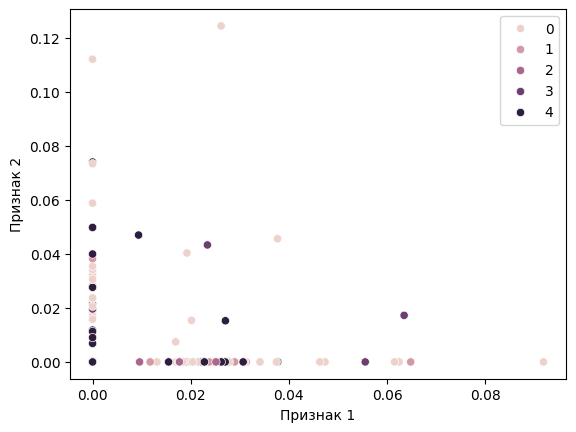

In [239]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(x=ratings.iloc[:, 2], y=ratings.iloc[:, 3000], hue=labels_km)
plt.xlabel('Признак 1')
plt.ylabel('Признак 2')


**Ответ:** На данной визулизации кластеры не отражаются, так как для визулизации я использовал 3 признак и 3001, а они для многих исполнителей равны 0, так как этих исполнителей пользователи не слушали и из-за этого многие точки отображаются как по оси x так и по оси y равными нулю. На графике видно, что точек не очень много, так как большинство объектов находятся в координате (0, 0)

Для визуализации данных высокой размерности существует метод t-SNE (стохастическое вложение соседей с t-распределением). Данный метод является нелинейным методом снижения размерности: каждый объект высокой размерности будет моделироваться объектов более низкой (например, 2) размерности таким образом, чтобы похожие объекты моделировались близкими, непохожие - далекими с большой вероятностью.

Примените `TSNE` из библиотеки `sklearn` и визуализируйте полученные объекты, покрасив их в цвета их кластеров

<Axes: >

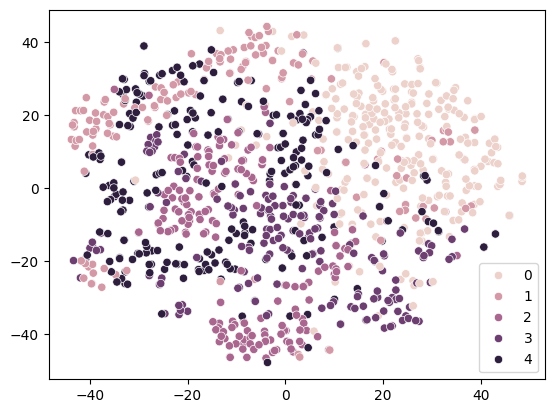

In [ ]:
from sklearn.manifold import TSNE

ratings_2d = TSNE(n_components=2).fit_transform(ratings)
sns.scatterplot(x=ratings_2d[:, 0], y=ratings_2d[:, 1], hue=labels_km)

## Задание 7 (1 балл) Подбор гиперпараметров

Подберите оптимальное количество кластеров (максимум 100 кластеров) с использованием индекса Силуэта. Зафиксируйте `random_state=42`

In [244]:
from sklearn.metrics import silhouette_score
best_num_cluster = 0
best_score = 0
for i in range(2, 101):
    model = KMeans(n_clusters=i, random_state=42)
    score = silhouette_score(ratings, model.fit_predict(ratings))
    if score > best_score:
        best_score = score
        best_num_cluster = i
print(best_score)
print(best_num_cluster)
best_km = KMeans(n_clusters=best_num_cluster)
best_km.fit(ratings)    

0.0133271084415419
98


KMeans(n_clusters=98)

Выведите исполнителей, ближайших с центроидам (аналогично заданию 5). Как соотносятся результаты? Остался ли смысл кластеров прежним? Расскажите про смысл 1-2 интересных кластеров, если он изменился и кластеров слишком много, чтобы рассказать про все.

In [243]:
ratings_best_norm_copy = ratings.copy()
ratings_best_norm_copy['num_cluster'] = best_km.labels_
centroids = best_km.cluster_centers_
result = {}
for i, centroid in enumerate(centroids):
    temp = ratings_best_norm_copy[ratings_best_norm_copy['num_cluster'] == i].iloc[:, :-1]
    distance_dict = {}
    for index, row in temp.iterrows():
        distance = cosine(row.to_numpy(), centroid)
        distance_dict[index] = distance
    sorted_array = sorted(distance_dict.items(), key=lambda x: x[1], reverse=True)[:10]
    result[i] = sorted_array
print(result)

{0: [('cunninlynguists', 0.4086951128790943), ('outkast', 0.3577510662110469), ('common', 0.332738526877599)], 1: [('fort minor', 0.6922194118116707), ('five iron frenzy', 0.6464124421341767), ('bon jovi', 0.6449870323835265), ('yellowcard', 0.6084572526105543), ('rent: original broadway cast', 0.6082708941468171), ('plain white t＇s', 0.607904792896433), ('bowling for soup', 0.573202959451945), ('evril lavigne', 0.5507637900492939), ('good charlotte', 0.42155857924651385)], 2: [('eisley', 0.6826439500762953), ('walt disneys', 0.6629980118194447), ('cascada', 0.6400129860267366), ('my chemicall romance', 0.6268108542305569), ('tatu', 0.6233963381541876), ('flyleaf', 0.593986204295683), ('breaking benjamin', 0.5596466176960284), ('\u200clinkin park', 0.5208721168355176), ('evanescense', 0.4485316202458475)], 3: [('antony; johnsons', 0.7039559034704336), ('les savy fav', 0.6498572314007292), ('yo la tengo', 0.6340934084609449), ('guided by voices', 0.6243234256274716), ('wolf parade', 0.6

In [275]:
for key, value in result.items():
    for name, dist in value:
        if key == 12:
            print(value)
            break

[('screeching weasel', 0.6049030573945915), ('the aquabats!', 0.5414987909767752), ('against me!', 0.49128560858807657), ('the mighty mighty bosstones', 0.46607456100586797), ('catch 22', 0.413435844776857), ('streetlight manifesto', 0.387509431098496), ('bomb the music industry!', 0.38543019098019815), ('big d and the kids table', 0.38352953872440854)]


**Ответ:** Смысл кластеров в целом остался прежним: кластеры разделяют исполнителей по предпочтениям пользователей, но теперь кластеры более детально разделяют стили музыки. Например к 12-ому кластеру топ-3 исполнителя относятся к рок группе, остальные исполнители этого кластера к спа-панк группе, возможно эти стили очень похожи. Метрика силуэта ближе к нулю, это означает, что объекты находятся на границах кластерах друг друга, то есть некоторые группы могут относиться к року, но при этом находиться в разных кластерах.

Сделайте t-SNE визуализацию полученной кластеризации.

<Axes: >

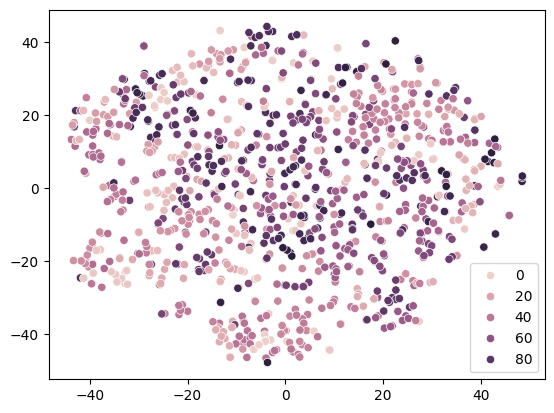

In [246]:
sns.scatterplot(x=ratings_2d[:, 0], y=ratings_2d[:, 1], hue=best_km.labels_)

Если кластеров получилось слишком много и визуально цвета плохо отличаются, покрасьте только какой-нибудь интересный кластер из задания выше (`c = (labels == i)`). Хорошо ли этот кластер отражается в визуализации?

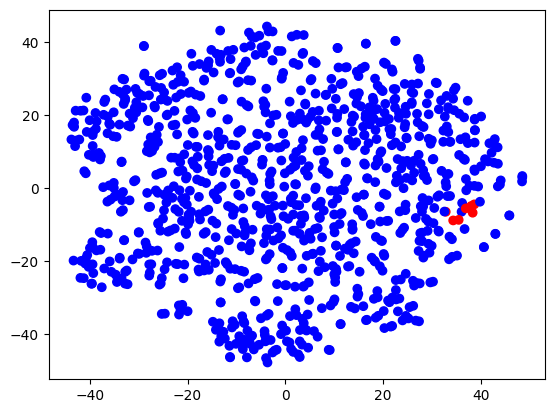

In [273]:
colors = ["blue" if label != 12 else "red" for label in best_km.labels_]
plt.scatter(ratings_2d[:, 0], ratings_2d[:, 1], c=colors)

**Ответ:** Данный кластер хорошо отображается, так как точки находяться рядом друг с другом